In [1]:
WIDTH = 100
HEIGHT = 600
BATCH_SIZE=8

In [2]:
import model_arch
import data_augment

In [3]:
from xml.etree import ElementTree
import glob
from skimage.io import imread
from skimage import draw, morphology, transform, util
import numpy as np
from tensorflow import keras
import tensorflow as tf
import typing

In [4]:
print(tf.config.list_physical_devices())

In [5]:
from skimage.io import imshow
from matplotlib import pyplot

In [6]:
tf.keras.backend.set_image_data_format('channels_last')

In [7]:
def get_annotations(filename) -> ElementTree.ElementTree:
    et = ElementTree.parse(filename)
    return et

def get_image_names(folder_pattern) -> typing.List[str]:
    image_names = sorted(glob.glob(folder_pattern))
    return image_names

In [8]:
def extract_points(polyline):
    pstr = polyline.attrib['points']
    pairs = pstr.split(';')
    points = []
    for pair in pairs:
        xstr, ystr = pair.split(',')
        x = float(xstr)
        y = float(ystr)
        points.append((x,y))
    return points

In [9]:
def extract_polylines(image_elem):
    polyline_elems = image_elem.findall('polyline')
    polylines = []
    for elem in polyline_elems:
        points = extract_points(elem)
        polylines.append(points)
    return polylines

In [10]:
def extract_all_paths(annotation):
    paths = {}
    image_elems = annotation.findall("image")
    for element in image_elems:
        name = element.attrib['name']
        polylines = extract_polylines(element)
        paths[name] = polylines
    return paths

In [11]:
def create_mask(polylines):
    blank = np.zeros((HEIGHT, WIDTH), dtype=bool)
    for pline in polylines:
        for i in range(len(pline) - 1):
            start_x, start_y = pline[i]
            end_x, end_y = pline[i + 1]
            # enforcing bounds
            start_x = round(min(max(0, start_x), WIDTH - 1))
            start_y = round(min(max(0, start_y), HEIGHT - 1))
            end_x = round(min(max(0, end_x), WIDTH - 1))
            end_y = round(min(max(0, end_y), HEIGHT - 1))
            # bounds have been enforced
            line = draw.line(start_y, start_x, end_y, end_x)
            blank[line] = True
    # improves visual strength and better perceptual representation
    blank = morphology.dilation(blank)
    return blank

In [12]:
def organize_data(image_names, proboscis_coords):
    input_images = []
    output_images = []
    for name in image_names:
        img = imread(name)
        input_images.append(img)
        plines = proboscis_coords[name]
        mask = create_mask(plines)
        output_images.append(mask)
    input_data = np.array(input_images)
    input_data = input_data[..., np.newaxis]
    output_data = np.array(output_images)
    output_data = output_data[..., np.newaxis]
    return input_data, output_data

In [13]:
annotations = get_annotations("trainInPlabels_annotations.xml")
proboscis_labels_coord = extract_all_paths(annotations)
image_names = get_image_names("trainInP/*")

In [14]:
indata, outdata = organize_data(image_names, proboscis_labels_coord)

In [15]:
imseq = data_augment.ImageSeq(indata, outdata, batch=BATCH_SIZE)
rep = data_augment.RepeatSeq(imseq, 10)
rf = data_augment.RandomFlip(rep)
shift1 = data_augment.RandomXShift(rf)
augmented = data_augment.RandomYShift(shift1)

In [16]:
model = model_arch.our_model()
print(model.summary())

In [ ]:
model.fit(augmented, epochs=40)

In [ ]:
model.save("proboscis_model_b3")

In [12]:
#model = keras.models.load_model("proboscis_model_b1")

2023-05-31 12:13:24.844920: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2023-05-31 12:13:24.845108: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-05-31 12:13:24.845122: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Silicon-Eye): /proc/driver/nvidia/version does not exist
2023-05-31 12:13:24.846135: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [20]:
test_names = get_image_names("big/*")
test_images = map(imread, test_names)
out_arrays = []
in_arrays = []
for i in range(0,len(test_names),16):
    if i + 16 >= len(test_names):
        break
    images = []
    for j in range(i,i+16):
        img = next(test_images)
        images.append(img)
    img_array = np.array(images)
    img_array = img_array[...,np.newaxis]
    out = model(img_array)
    out_array = out.numpy()
    in_arrays.append(img_array)
    out_arrays.append(out_array)

In [30]:
from skimage.filters import threshold_li

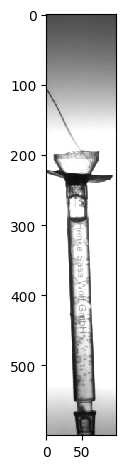

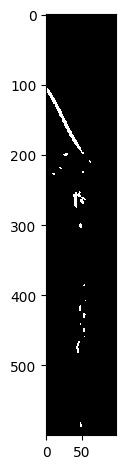

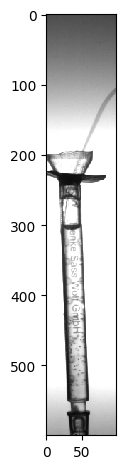

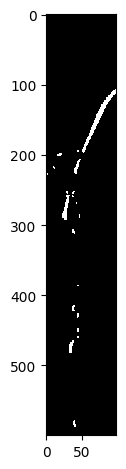

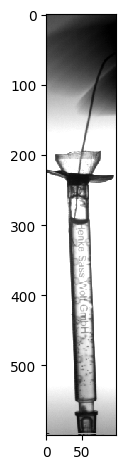

...

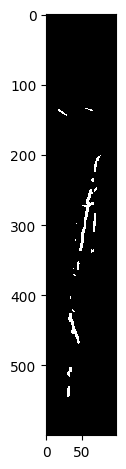

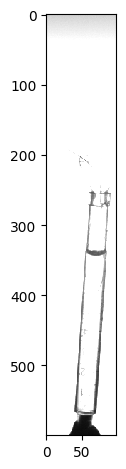

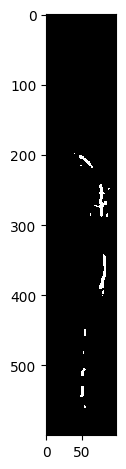

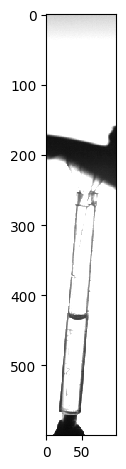

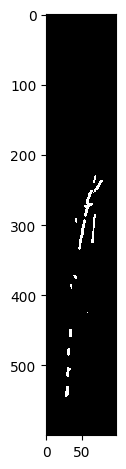

In [36]:
for q in range(len(in_arrays)):
    for k in range(16):
        imshow(in_arrays[q][k,:,:,0])
        pyplot.show()
        li = threshold_li(out_arrays[q][k,:,:,0])
        imshow(out_arrays[q][k,:,:,0] > 0.05)
        pyplot.show()